<a href="https://colab.research.google.com/github/robsymowen/Project-Line/blob/main/Cluster_LineDrawing_Training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import _LRScheduler
import torch.utils.data as data

import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torchvision import models

from sklearn import decomposition
from sklearn import manifold
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from tqdm.notebook import tqdm, trange
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import copy
import os
import random
import time

In [ ]:
# Location of tarred dataset:
data_dir = '/content/drive/MyDrive/ThomasGarity/LineDrawing/imagenette2-320-20bc6e8beb.tar.gz'

In [ ]:
 # Set paths to models:
output_dir = "/content/drive/MyDrive/ThomasGarity/LineDrawing/Models"
model_name = "ImagenetteAlexNet_11.pth.tar"

checkpoint_name = os.path.join(output_dir, model_name)

In [ ]:
# Set Model Parameters
learning_rate = .001
weight_decay = 0.001
num_classes = 10 # Set to 1000 for Imagenet training
num_workers = 2 # Should this take on a new value for the cluster
num_epochs = 50

# Check Hash ID of Dataset and Untar


In [ ]:
## Helpers for hashing filename and checking hash

# Import hash function, create hash object.
import hashlib

# Helper for calculating hash id for any file path
def get_hash(filename):
    sha256 = hashlib.sha256()
    with open(filename, 'rb') as file:
        for chunk in iter(lambda: file.read(8192), b''):
            sha256.update(chunk)

    # Get the last 10 digits of the hash
    hash_id = sha256.hexdigest()[-10:]
    return hash_id

#  helper - check hash ID
def check_hash_id(filename):
    # Extract the expected hash value from the filename
    expected_hash = filename.split('-')[-1].split('.')[0]

    if not (os.path.exists(filename) and os.path.isfile(filename)):
        raise FileNotFoundError(f"The file {filename} does not exist or the path is incorrect.")

    hash_id = get_hash(filename)

    # Check if the end of the file name matches the hash_id
    if expected_hash != hash_id:
        raise ValueError(f"The end of the file name {expected_hash} does not match the calculated hash_id {hash_id}.")

In [ ]:
import shutil

def load_dataset(drive_tarred_dir):
    tarred_dataset_name = drive_tarred_dir.split('/')[-1]

    # Create content/data directory, for holding datasets
    !mkdir -p /content/data

    # Move dataset to content/data
    dst_path ='/content/data/' + tarred_dataset_name
    shutil.copy(drive_tarred_dir, dst_path)

    # Check that the dataset is correctly hashed
    check_hash_id(dst_path)
    print("Hash is correct")

    # Untar Dataset
    !tar -xf $dst_path -C /content/data/

    # Create dataset name for output directory
    dataset_name = tarred_dataset_name.split('-' + get_hash(dst_path))[0]
    content_dir_path = '/content/data/' + dataset_name

    return content_dir_path

In [ ]:
# Load Datasets and set directories in the local /content/data directory
data_dir = load_dataset(data_dir)

print(data_dir)

IsADirectoryError: ignored

# Set up *Model*

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from torchvision.models import alexnet

In [ ]:
# Set your train and validation directories
traindir = data_dir+'/train'
valdir = data_dir+'/val'

In [ ]:
# Assuming your data is structured in a directory where each sub-directory represents a class
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225])


train_dataset = datasets.ImageFolder(
             traindir,
             transforms.Compose([
                transforms.RandomResizedCrop(224),
                transforms.RandomHorizontalFlip(),
                transforms.ToTensor(),
                normalize,
             ]))

val_dataset = datasets.ImageFolder(
             valdir,
             transforms.Compose([
                transforms.Resize(256),
                transforms.CenterCrop(224),
                transforms.ToTensor(),
                normalize,
             ]))


train_dataloader = DataLoader(train_dataset, batch_size=256, shuffle=True, num_workers=num_workers)
val_dataloader = DataLoader(val_dataset, batch_size=256, shuffle=True, num_workers=num_workers)


# Load a pre-trained AlexNet model or create a new one
# Set to False if you don't want to use pre-trained weights
model = alexnet(pretrained=False)

# If you're training from scratch, you might want to modify the last layer to fit your number of classes
model.classifier[6] = nn.Linear(model.classifier[6].in_features, num_classes)

# Move model to GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)



/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


cuda:0


In [ ]:
# Create output directory if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

print(checkpoint_name)

# If checkpoint exists, resume from checkpoint
if os.path.isfile(checkpoint_name):
    checkpoint = torch.load(checkpoint_name)
    model.load_state_dict(checkpoint['state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_dict'])
    start_epoch = checkpoint['epoch']
    logs = checkpoint['logs']
else:
    start_epoch = 0  # Start from epoch 0 if no checkpoint found
    logs = {}  # Initialize logs or any other variables you need to track

/content/drive/MyDrive/ThomasGarity/LineDrawing/Models/ImagenetteAlexNet_11.pth.tar


#Train the Model

In [ ]:
# Check checkpoint -- how many epochs have we ran?
print("Starting epoch:", start_epoch)

Starting epoch: 0


In [ ]:
# Compute accuracy for a set of outputs
def compute_num_correct(outputs, labels):

    # Calculate the predicted class
    _, predicted = torch.max(outputs, 1)  # Get the index of the max log-probability
    correct = (predicted == labels).float().sum().item()  # Convert into float for division
    return correct

In [ ]:
from fastprogress import master_bar, progress_bar
import seaborn as sns

def test_model(model, data_loader, device):
    print("Testing model")
    # Set model to eval mode
    model.eval()

    correct = 0
    total = 0

    with torch.no_grad():

        for images, labels in progress_bar(data_loader):
            images, labels = images.to(device), labels.to(device)

            # Run model on images and create predictions from output layer.
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)

            # Update accumulators
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    # Compute and return accuracy as percentage:
    accuracy = 100 * correct / total
    model.train()

    return accuracy

# Dictionary for storing results:
results = {'epoch':[], 'val_acc':[], 'train_acc':[]}

def display_progress(epoch, model, val_dataloader, train_acc):

    # Add to the dictionary of results
    results['epoch'].append(epoch)
    results['val_acc'].append(test_model(model, val_dataloader, device))
    results['train_acc'].append(train_acc)

    # Convert dictionary to dataframe to display results in a graph
    sns.lineplot(x=results['epoch'], y=results['train_acc'], label="Train Accuracy")
    sns.lineplot(x=results['epoch'], y=results['val_acc'], label="Validation Accuracy")
    plt.legend()
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy (%)")
    plt.title("Accuracy of Model throughout Training")
    plt.show();

    return 0

In [ ]:
from torchvision.utils import make_grid

# Display convolutional kernels of each model
def show_conv1(model, nrow=16):
    # find first conv
    first_conv = None
    for m in model.modules():
        if isinstance(m, nn.Conv2d):
            first_conv = m
            break

    if first_conv is not None:
        kernels = first_conv.weight.detach().clone().cpu()
        kernels = kernels - kernels.min()
        kernels = kernels / kernels.max()

        img = make_grid(kernels, nrow=nrow)
        plt.imshow(img.permute(1, 2, 0))
        plt.show();
    else:
        print("failed to find first conv layer")

Epoch:  0


Testing model


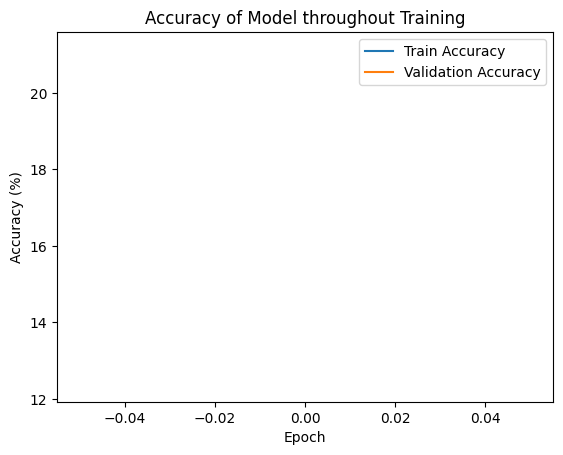

   epoch    val_acc  train_acc
0      0  21.146497   12.36667


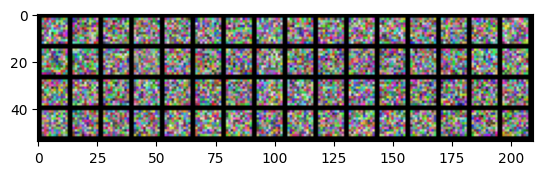

Epoch:  1


Testing model


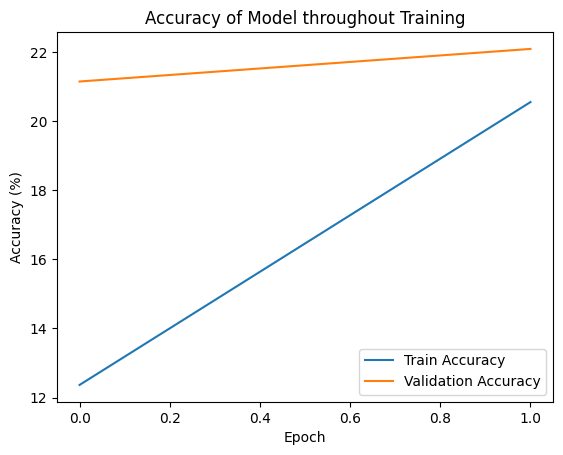

   epoch    val_acc  train_acc
0      0  21.146497  12.366670
1      1  22.089172  20.551273


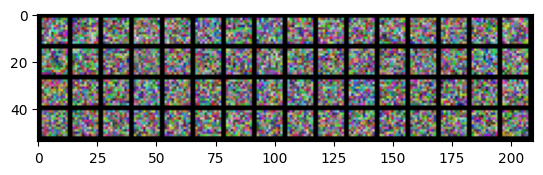

Epoch:  2


Testing model


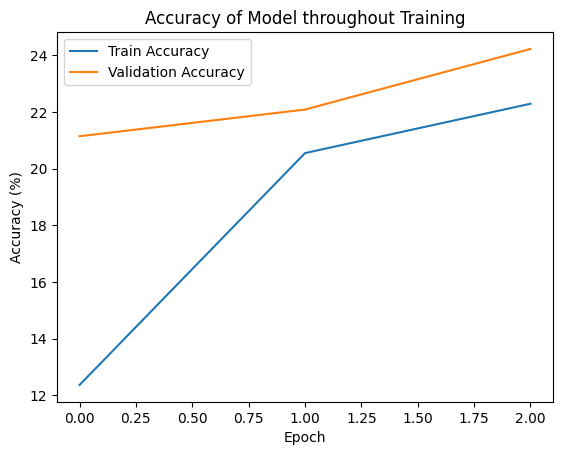

   epoch    val_acc  train_acc
0      0  21.146497  12.366670
1      1  22.089172  20.551273
2      2  24.229299  22.293801


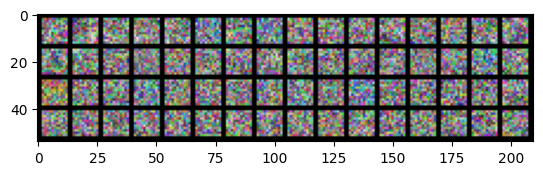

Epoch:  3


Testing model


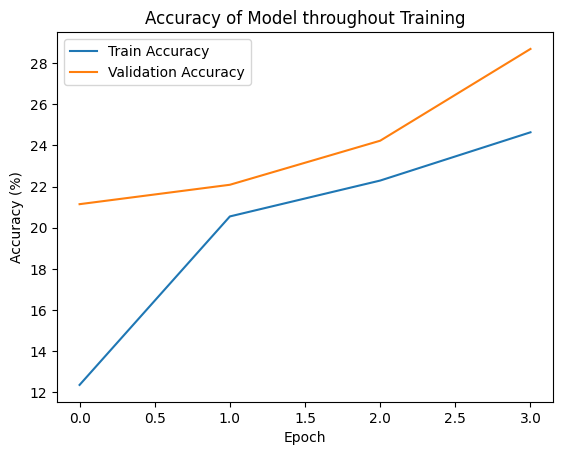

   epoch    val_acc  train_acc
0      0  21.146497  12.366670
1      1  22.089172  20.551273
2      2  24.229299  22.293801
3      3  28.687898  24.638293


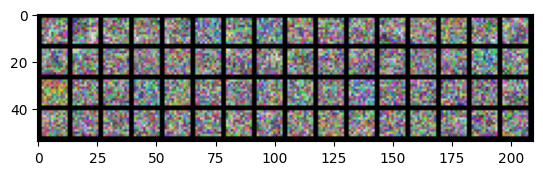

Epoch:  4


Testing model


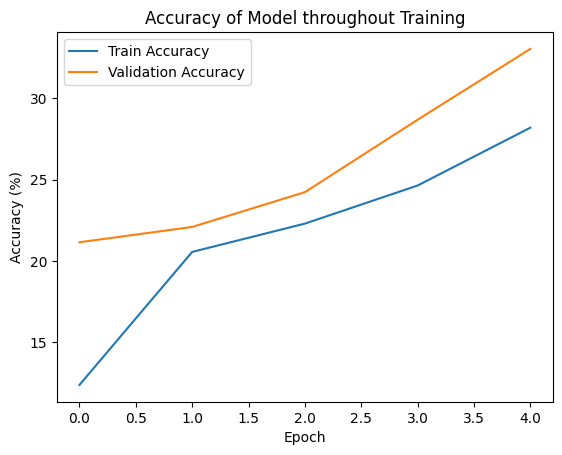

   epoch    val_acc  train_acc
0      0  21.146497  12.366670
1      1  22.089172  20.551273
2      2  24.229299  22.293801
3      3  28.687898  24.638293
4      4  33.044586  28.197275


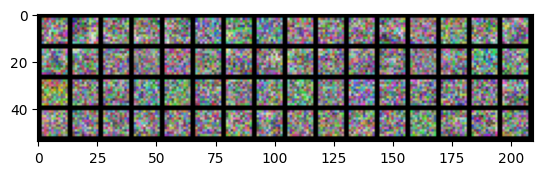

Epoch:  5


Testing model


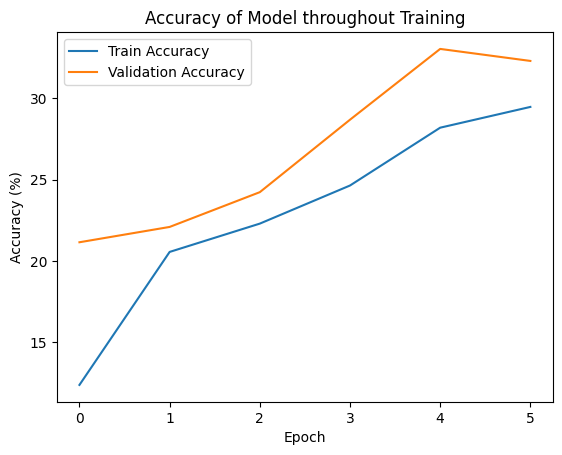

   epoch    val_acc  train_acc
0      0  21.146497  12.366670
1      1  22.089172  20.551273
2      2  24.229299  22.293801
3      3  28.687898  24.638293
4      4  33.044586  28.197275
5      5  32.305732  29.475129


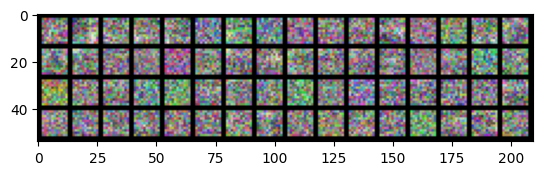

Epoch:  6


Testing model


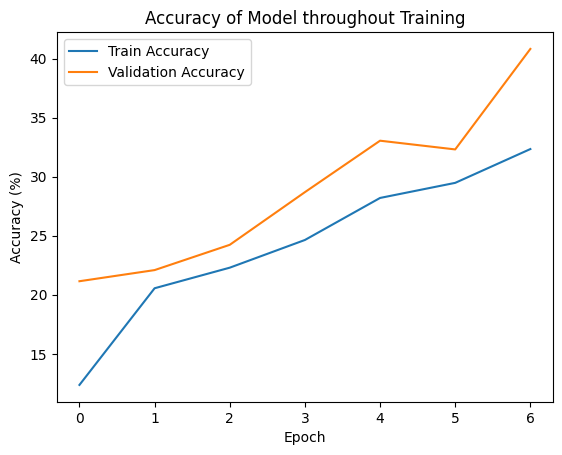

   epoch    val_acc  train_acc
0      0  21.146497  12.366670
1      1  22.089172  20.551273
2      2  24.229299  22.293801
3      3  28.687898  24.638293
4      4  33.044586  28.197275
5      5  32.305732  29.475129
6      6  40.815287  32.337100


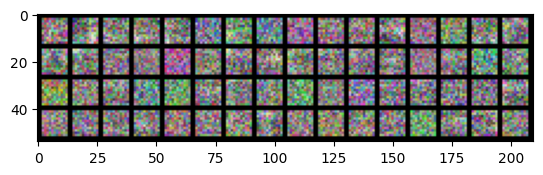

Epoch:  7


Testing model


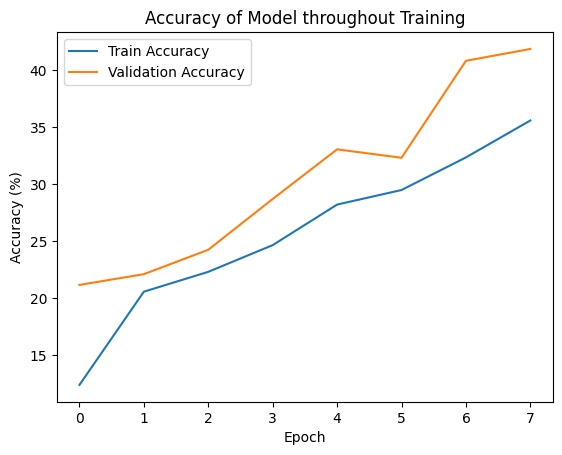

   epoch    val_acc  train_acc
0      0  21.146497  12.366670
1      1  22.089172  20.551273
2      2  24.229299  22.293801
3      3  28.687898  24.638293
4      4  33.044586  28.197275
5      5  32.305732  29.475129
6      6  40.815287  32.337100
7      7  41.859873  35.579259


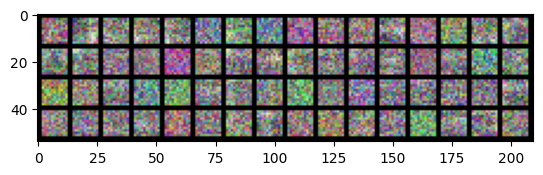

Epoch:  8


Testing model


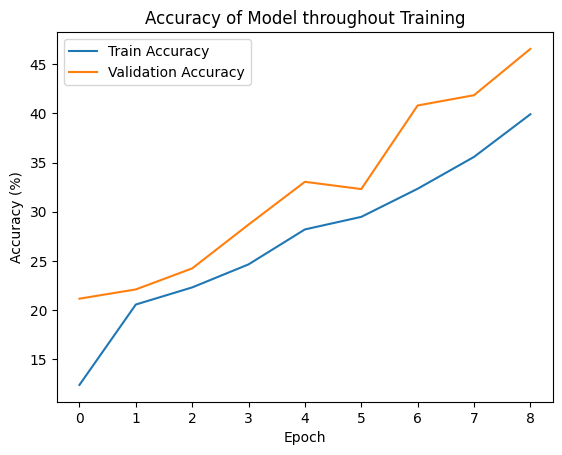

   epoch    val_acc  train_acc
0      0  21.146497  12.366670
1      1  22.089172  20.551273
2      2  24.229299  22.293801
3      3  28.687898  24.638293
4      4  33.044586  28.197275
5      5  32.305732  29.475129
6      6  40.815287  32.337100
7      7  41.859873  35.579259
8      8  46.573248  39.919738


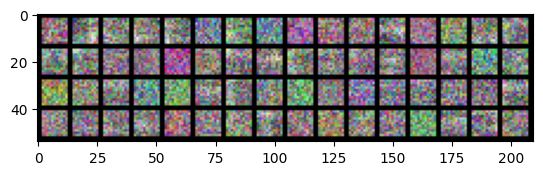

Epoch:  9


Testing model


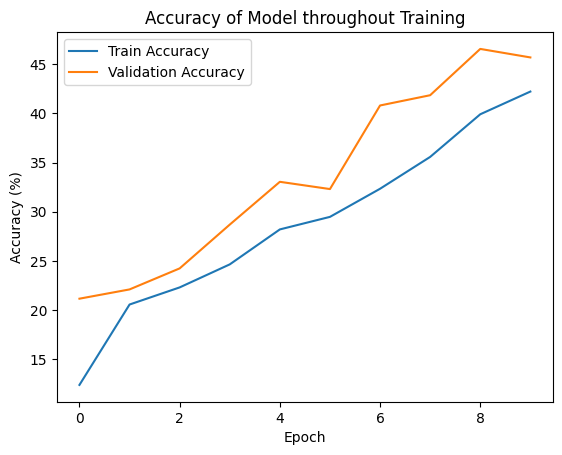

   epoch    val_acc  train_acc
0      0  21.146497  12.366670
1      1  22.089172  20.551273
2      2  24.229299  22.293801
3      3  28.687898  24.638293
4      4  33.044586  28.197275
5      5  32.305732  29.475129
6      6  40.815287  32.337100
7      7  41.859873  35.579259
8      8  46.573248  39.919738
9      9  45.707006  42.232548


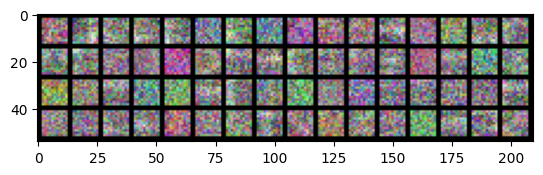

Epoch:  10


Testing model


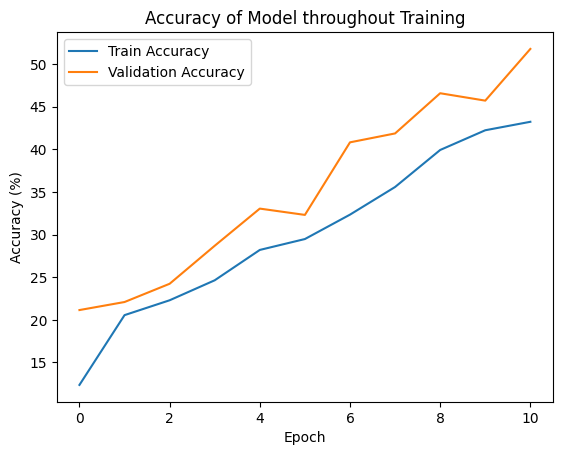

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261


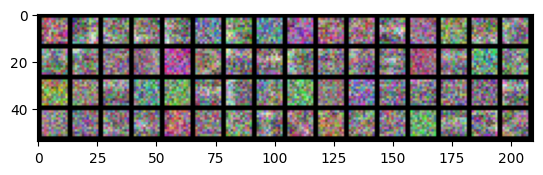

Epoch:  11


Testing model


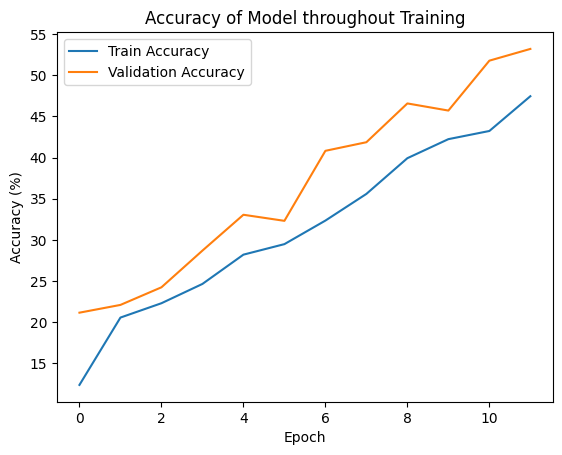

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572


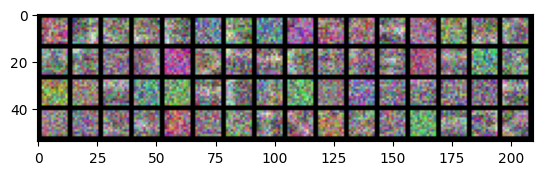

Epoch:  12


Testing model


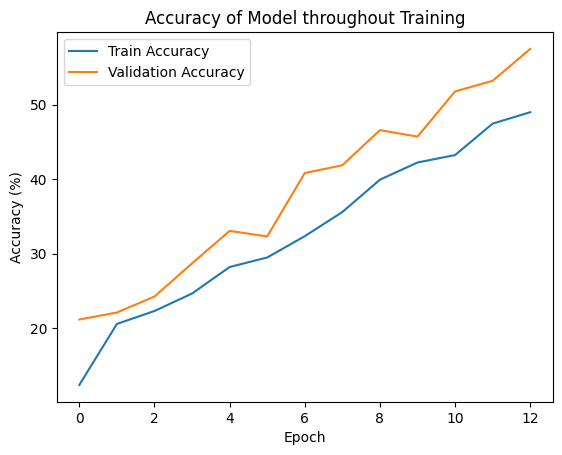

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885


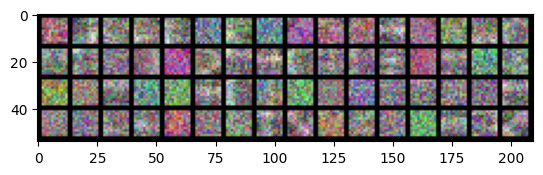

Epoch:  13


Testing model


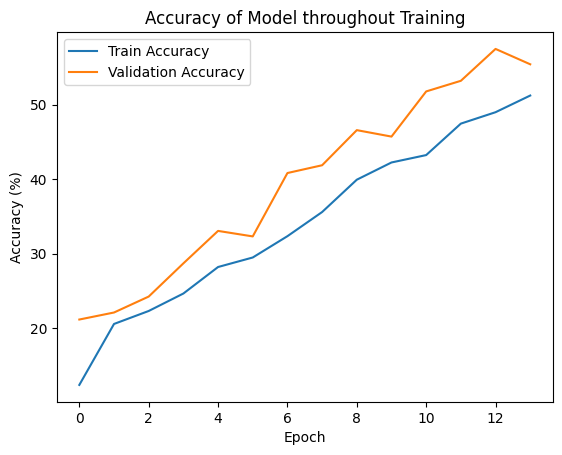

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770


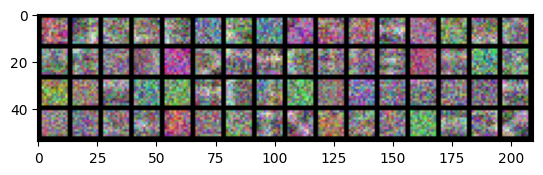

Epoch:  14


Testing model


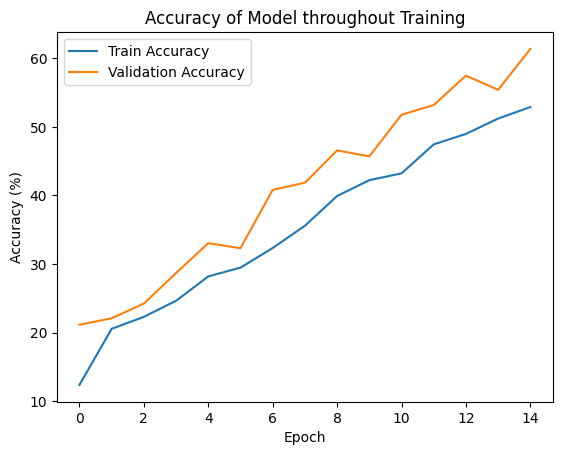

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933


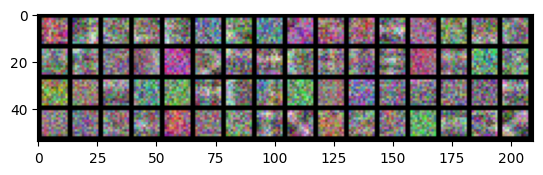

Epoch:  15


Testing model


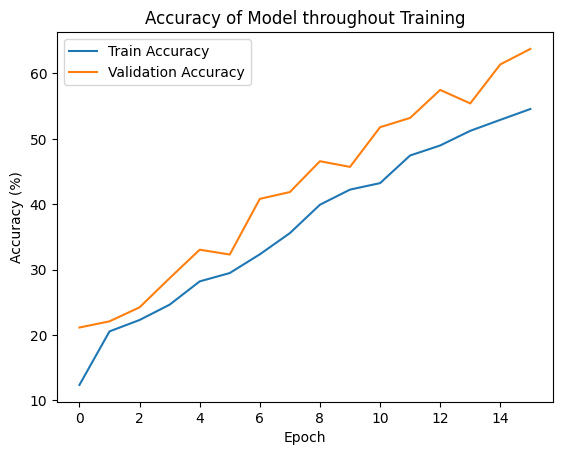

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975


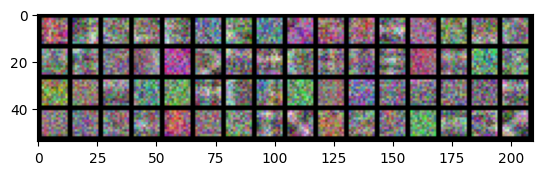

Epoch:  16


Testing model


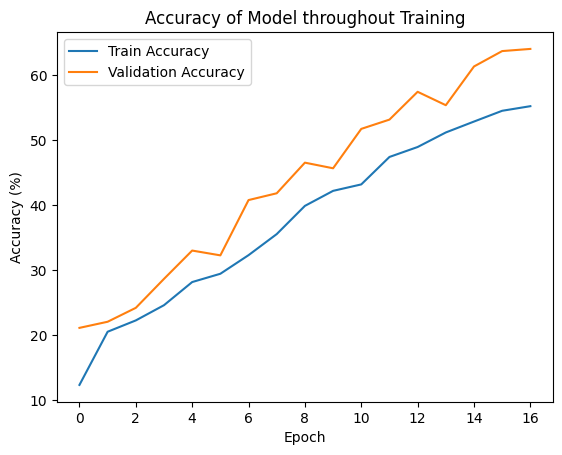

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547


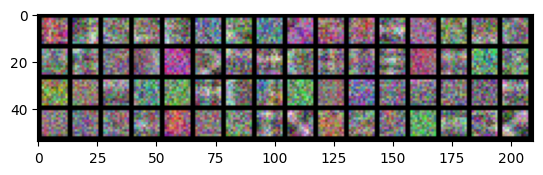

Epoch:  17


Testing model


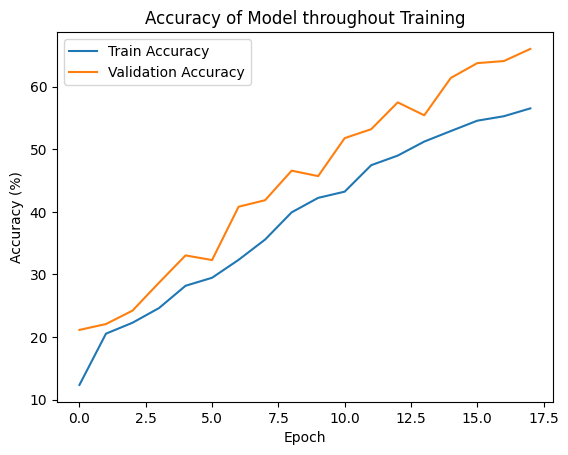

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280


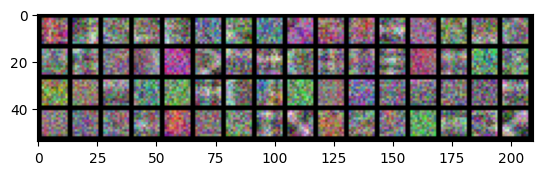

Epoch:  18


Testing model


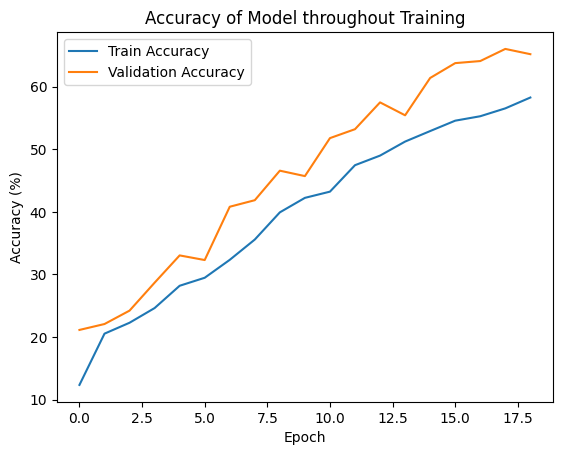

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247


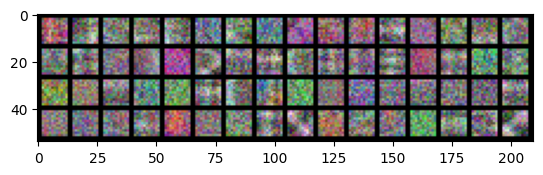

Epoch:  19


Testing model


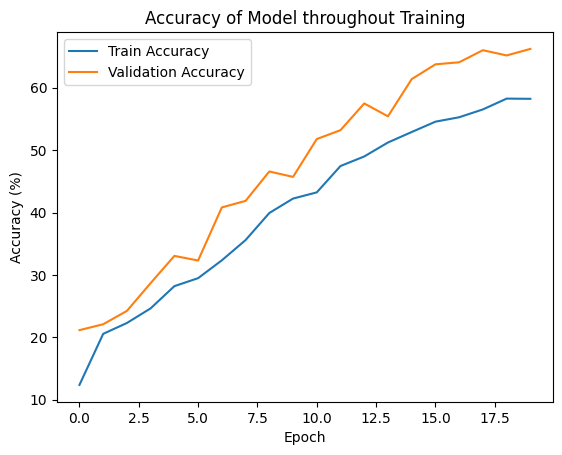

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565


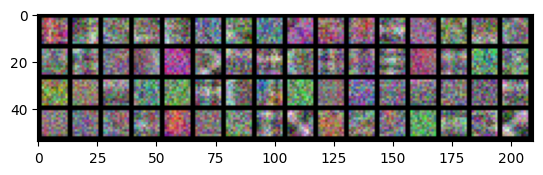

Epoch:  20


Testing model


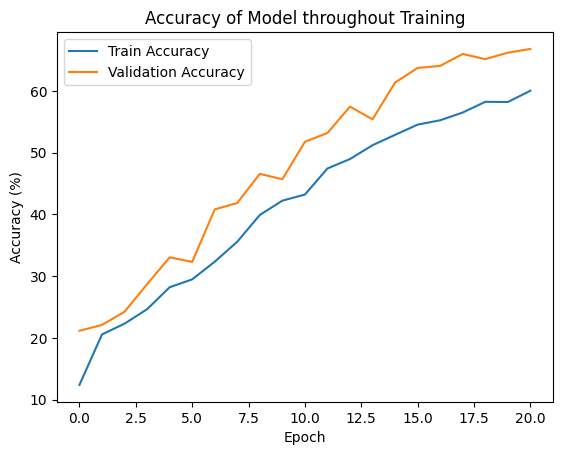

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580


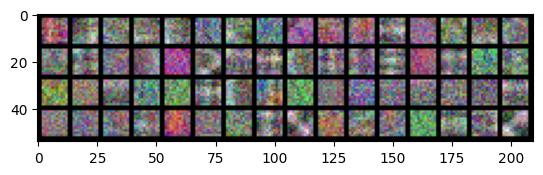

Epoch:  21


Testing model


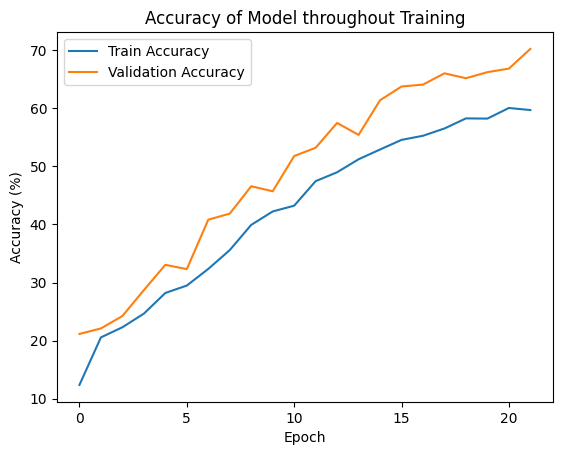

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513


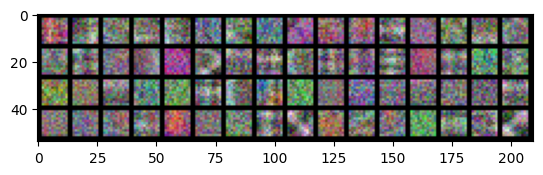

Epoch:  22


Testing model


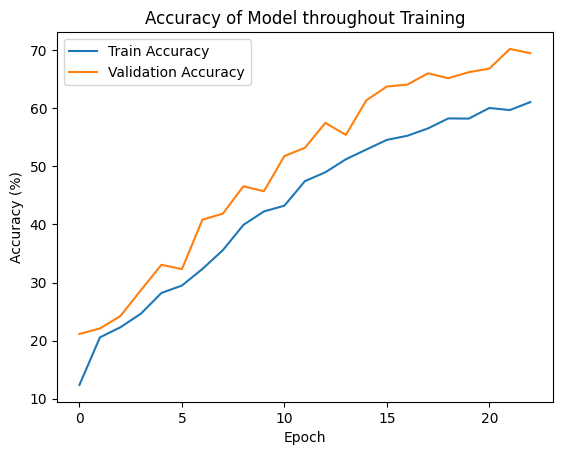

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414


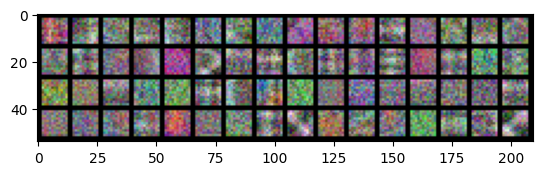

Epoch:  23


Testing model


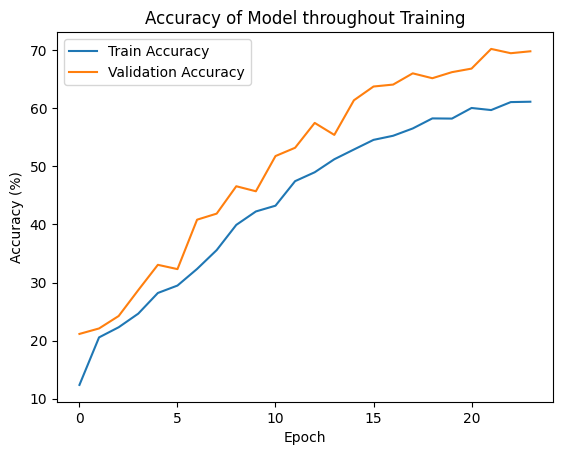

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779


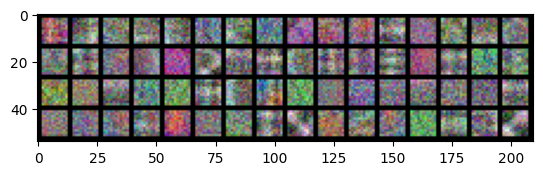

Epoch:  24


Testing model


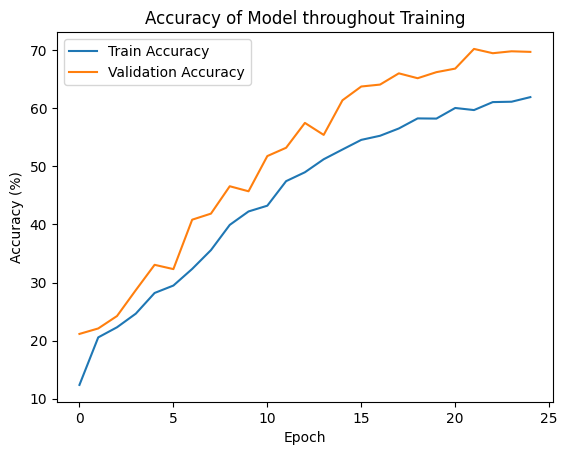

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837


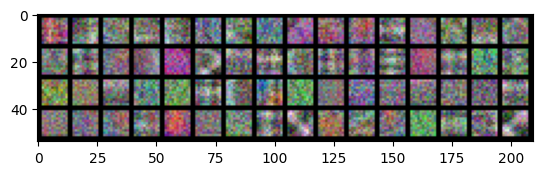

Epoch:  25


Testing model


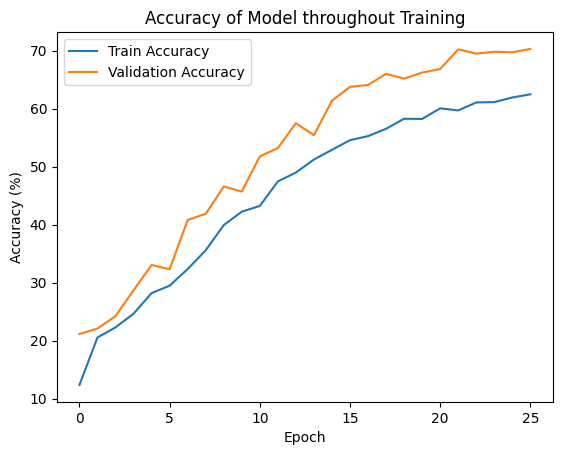

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998


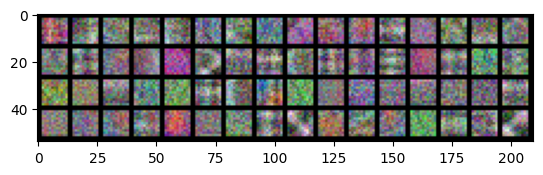

Epoch:  26


Testing model


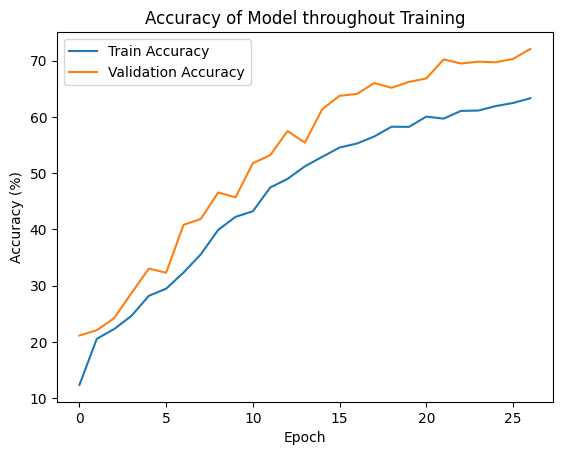

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860


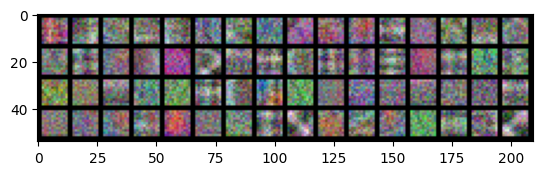

Epoch:  27


Testing model


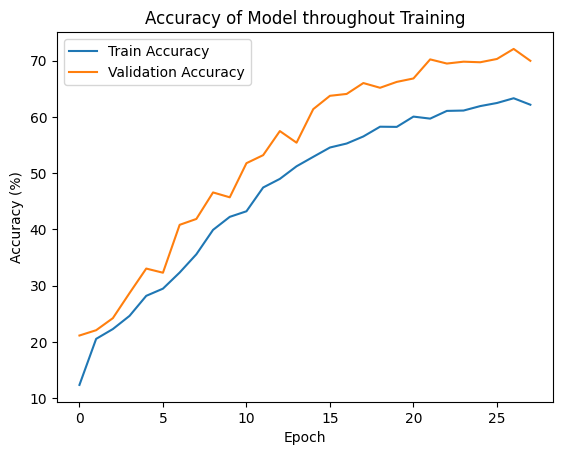

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735


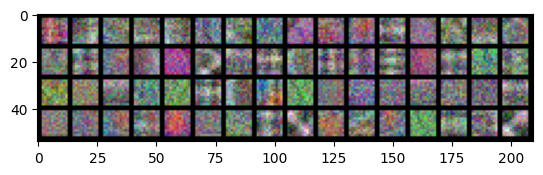

Epoch:  28


Testing model


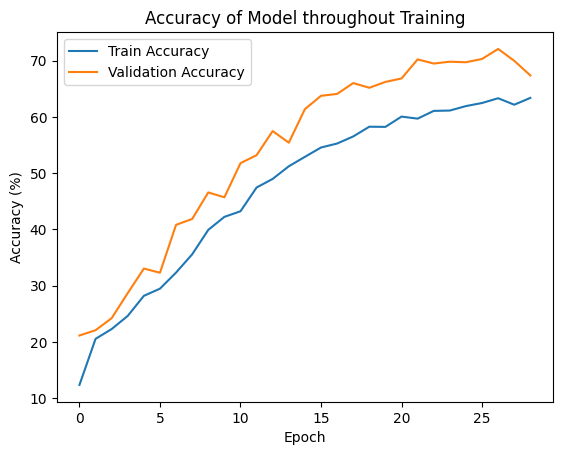

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224


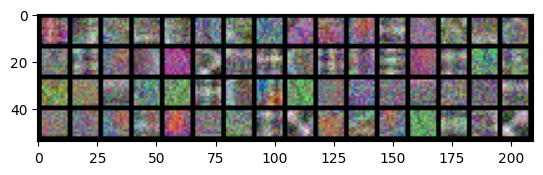

Epoch:  29


Testing model


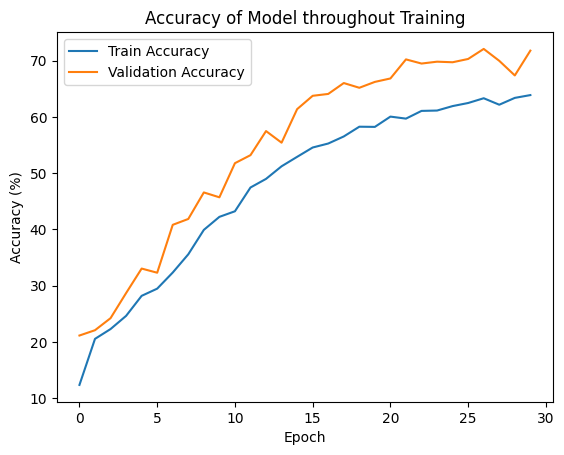

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581


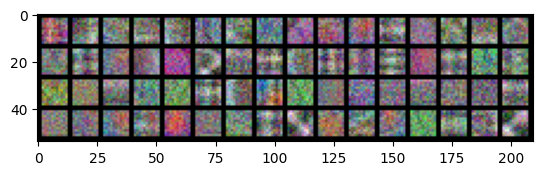

Epoch:  30


Testing model


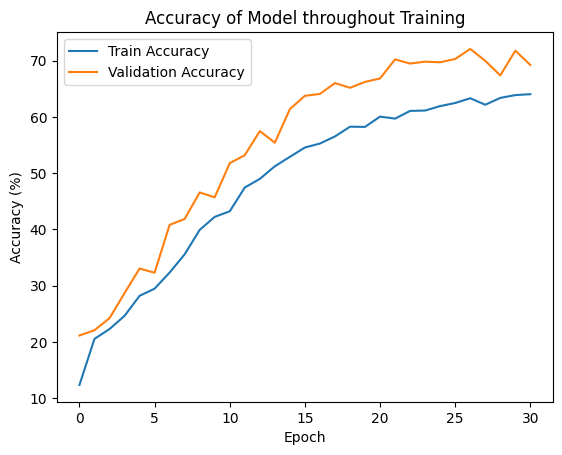

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

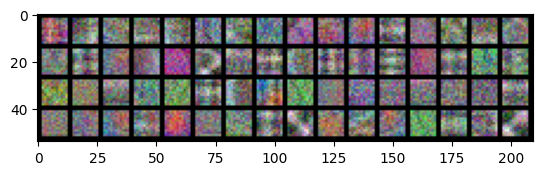

Epoch:  31


Testing model


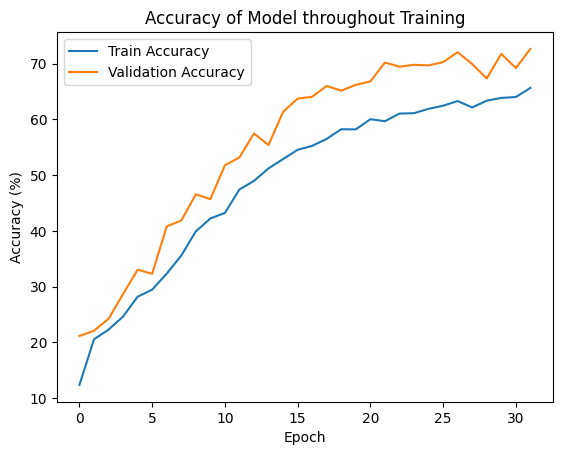

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

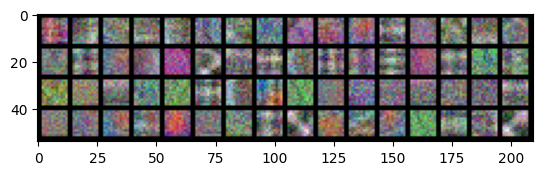

Epoch:  32


Testing model


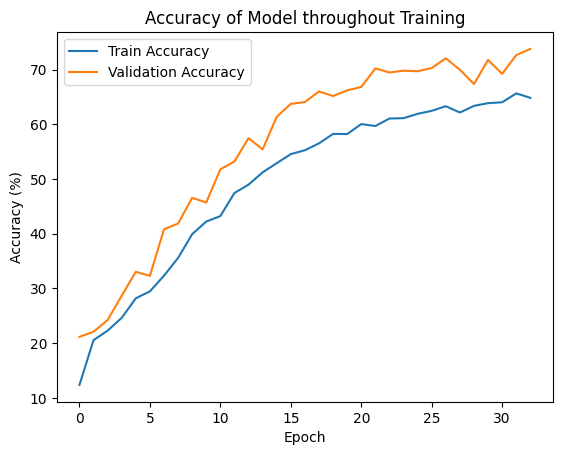

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

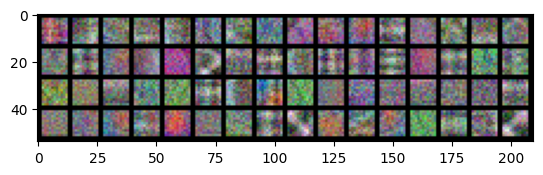

Epoch:  33


Testing model


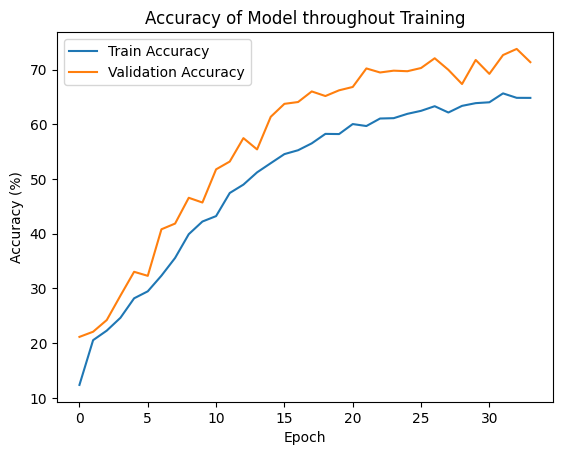

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

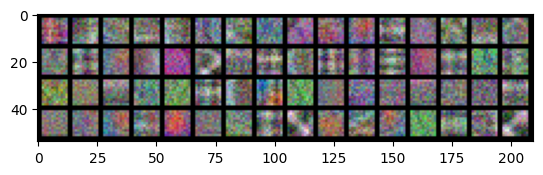

Epoch:  34


Testing model


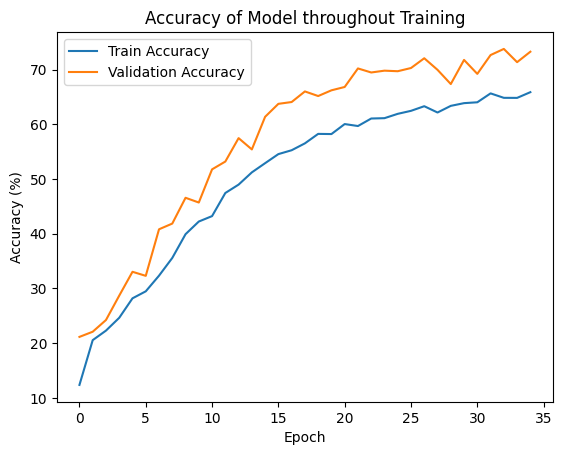

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

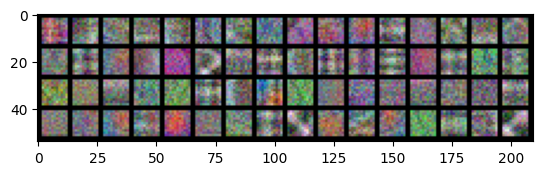

Epoch:  35


Testing model


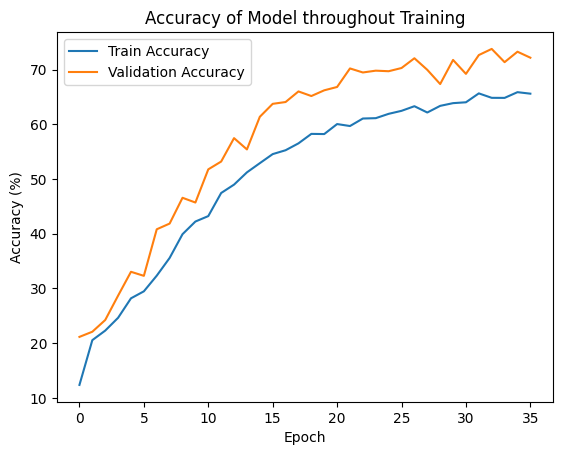

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

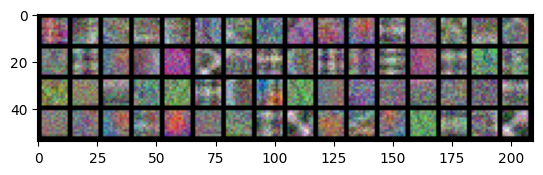

Epoch:  36


Testing model


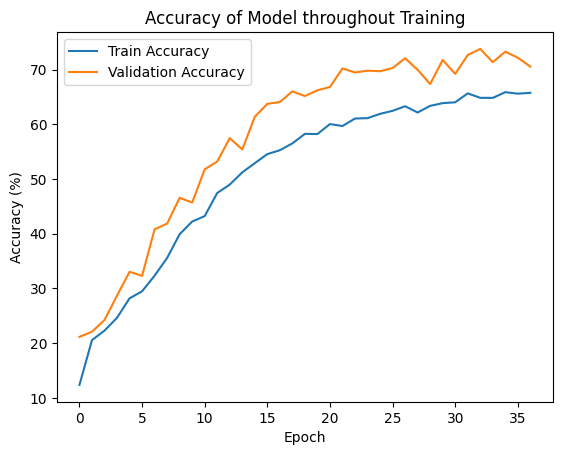

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

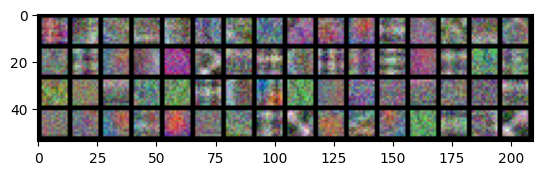

Epoch:  37


Testing model


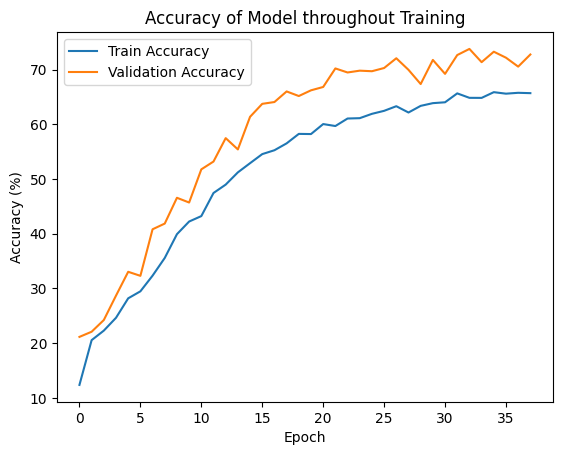

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

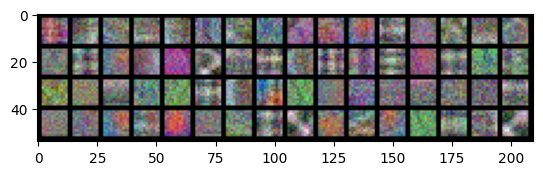

Epoch:  38


Testing model


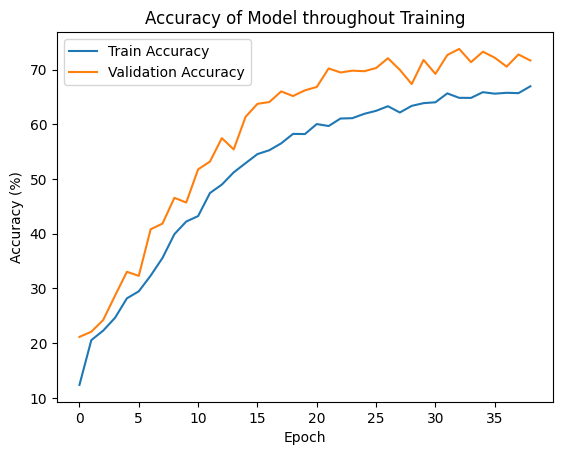

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

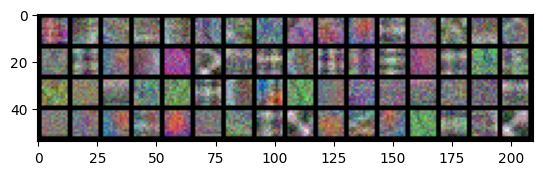

Epoch:  39


Testing model


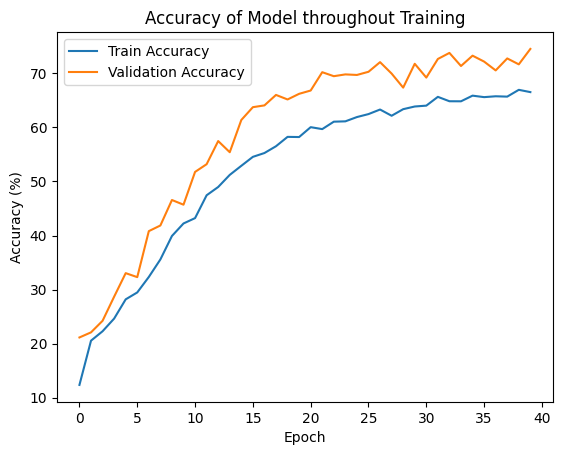

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

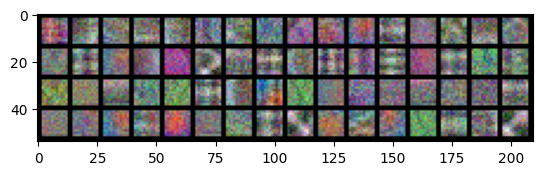

Epoch:  40


Testing model


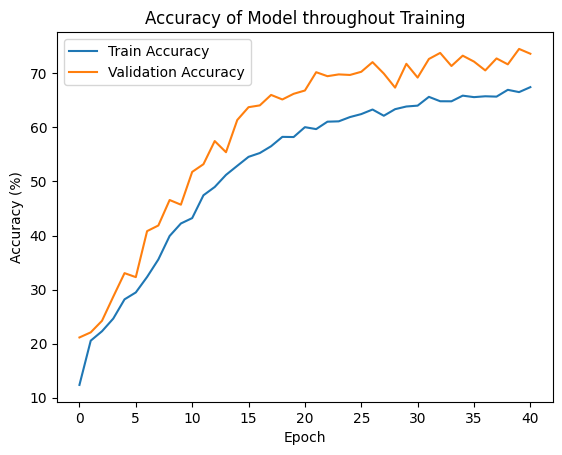

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

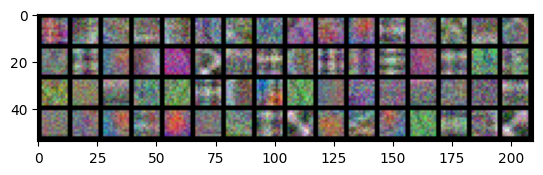

Epoch:  41


Testing model


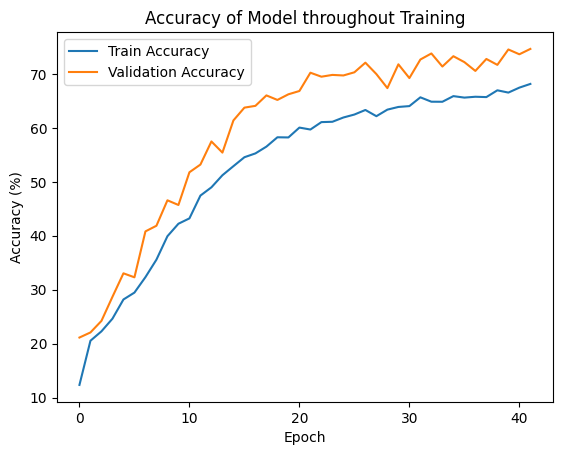

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

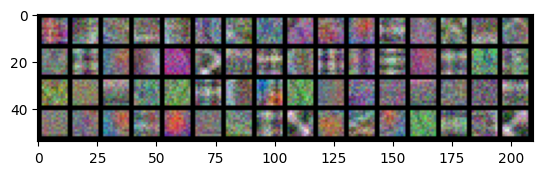

Epoch:  42


Testing model


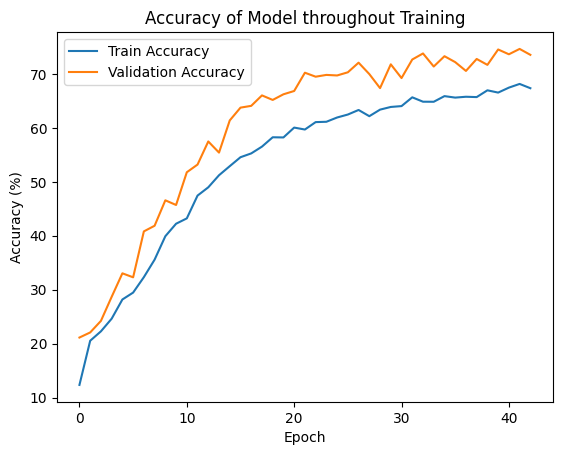

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

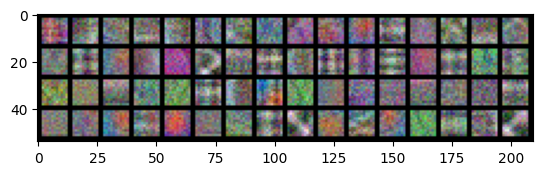

Epoch:  43


Testing model


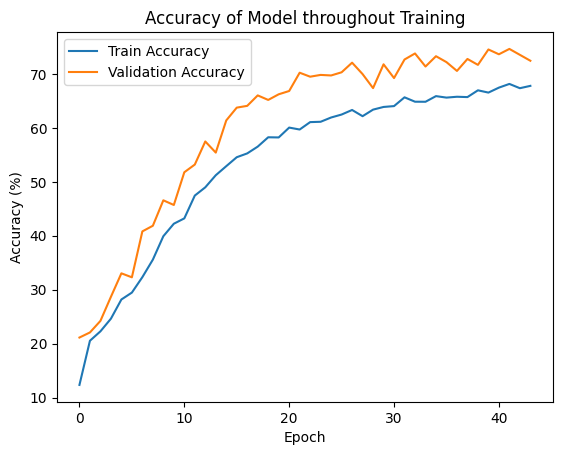

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

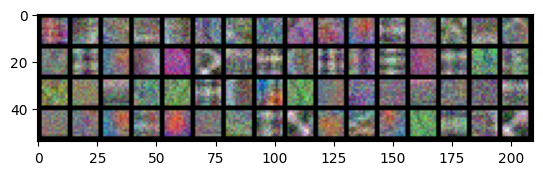

Epoch:  44


Testing model


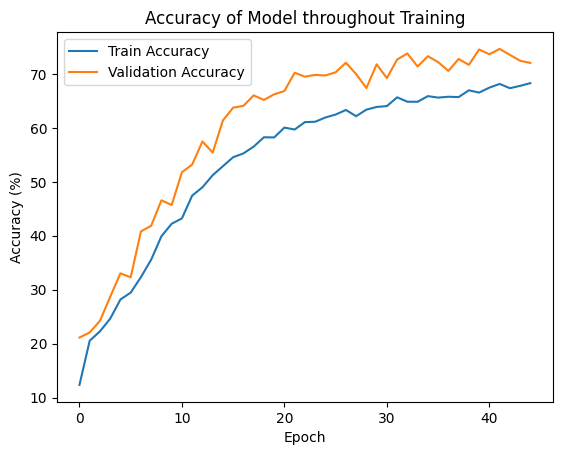

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

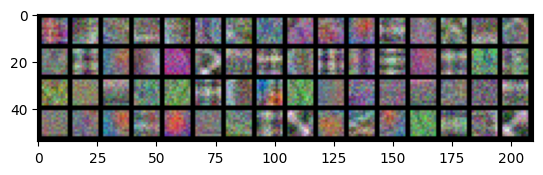

Epoch:  45


Testing model


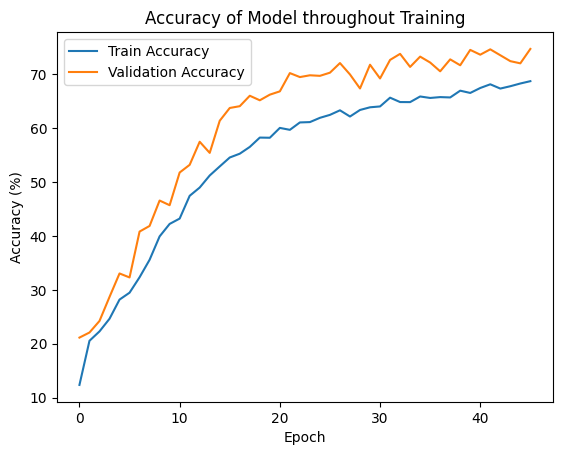

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

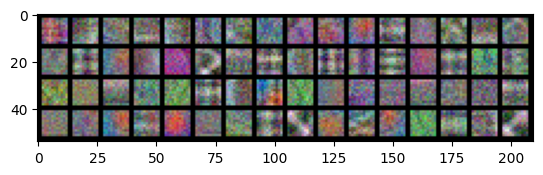

Epoch:  46


Testing model


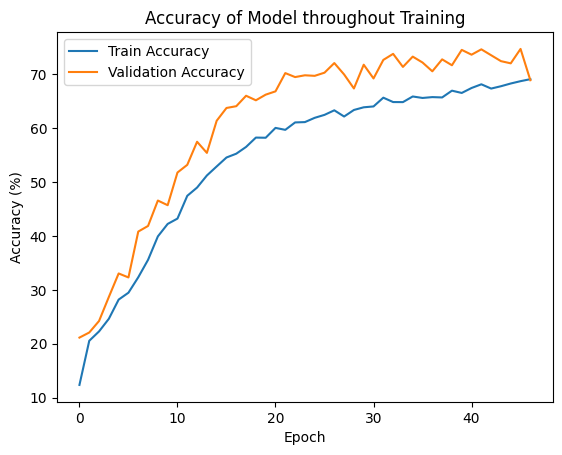

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

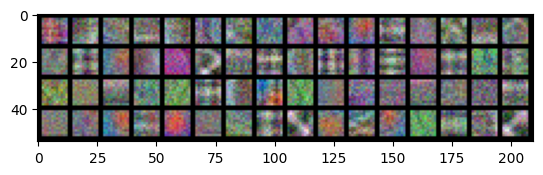

Epoch:  47


Testing model


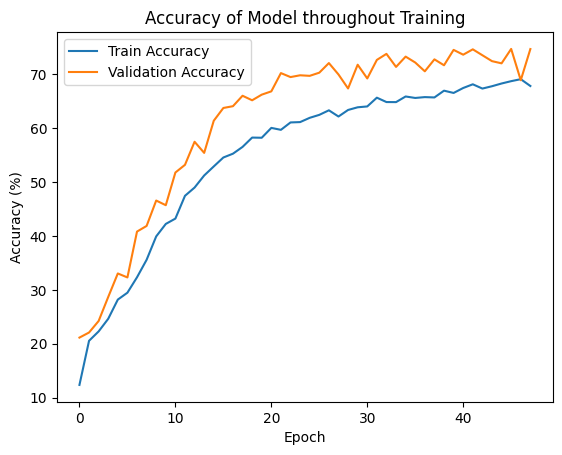

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

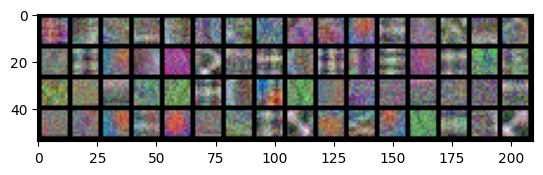

Epoch:  48


Testing model


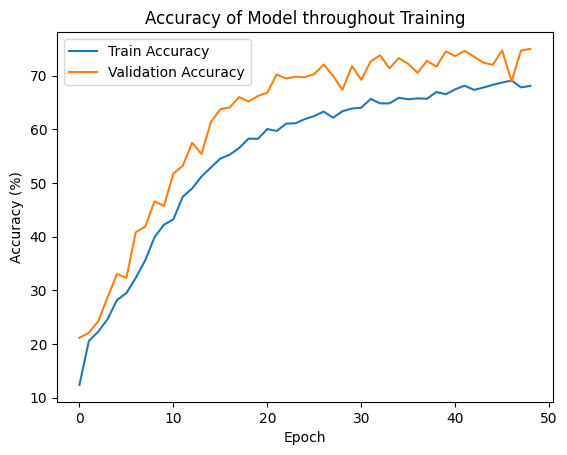

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

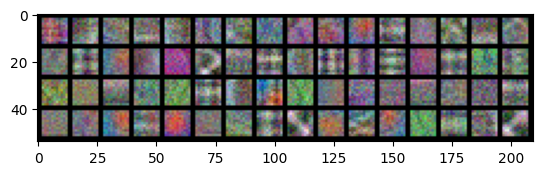

Epoch:  49


Testing model


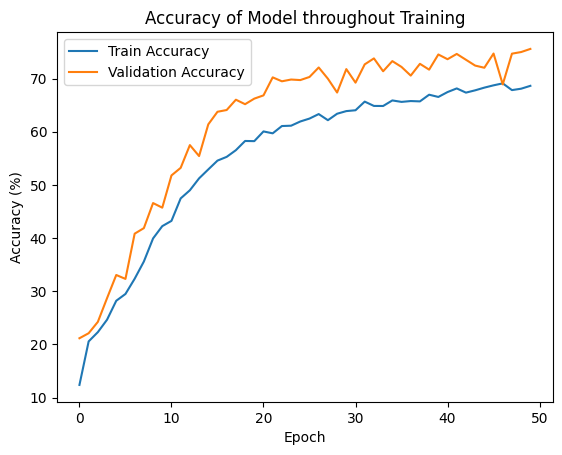

    epoch    val_acc  train_acc
0       0  21.146497  12.366670
1       1  22.089172  20.551273
2       2  24.229299  22.293801
3       3  28.687898  24.638293
4       4  33.044586  28.197275
5       5  32.305732  29.475129
6       6  40.815287  32.337100
7       7  41.859873  35.579259
8       8  46.573248  39.919738
9       9  45.707006  42.232548
10     10  51.770701  43.225261
11     11  53.197452  47.449572
12     12  57.477707  48.980885
13     13  55.414013  51.219770
14     14  61.375796  52.898933
15     15  63.745223  54.556975
16     16  64.076433  55.264547
17     17  66.012739  56.521280
18     18  65.171975  58.253247
19     19  66.216561  58.221565
20     20  66.828025  60.048580
21     21  70.216561  59.689513
22     22  69.477707  61.062414
23     23  69.808917  61.125779
24     24  69.707006  61.917837
25     25  70.292994  62.466998
26     26  72.076433  63.311860
27     27  69.961783  62.160735
28     28  67.363057  63.375224
29     29  71.770701  63.871581
30     3

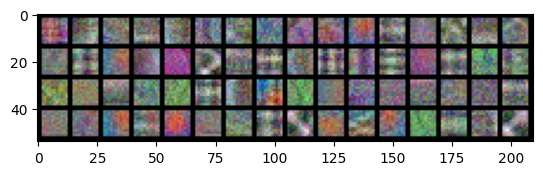

Finished Training


In [ ]:
# Training loop
from fastprogress import master_bar, progress_bar

model.train()

for i, epoch in enumerate(progress_bar(range(start_epoch, num_epochs))):  # loop over the dataset multiple times
    print("Epoch: ", epoch)
    running_loss = 0.0

    total = 0
    num_correct = 0

    for i, data in enumerate(progress_bar(train_dataloader), 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data[0].to(device), data[1].to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # Store accuracy
        total += inputs.shape[0]
        num_correct += compute_num_correct(outputs, labels)

    train_acc = 100 * num_correct/total

    # save checkpoint
    torch.save(dict(
      epoch=epoch+1,
      state_dict=model.state_dict(),
      optimizer_dict=optimizer.state_dict(),
      top_1 = train_acc,
      logs=logs
    ), checkpoint_name)

    display_progress(epoch, model, val_dataloader, train_acc)
    results_df = pd.DataFrame(results)
    print(results_df)

    # print statistics
    running_loss += loss.item()
    if i % 200 == 199:  # print every 200 mini-batches
        print('[%d, %5d] loss: %.3f' %
              (epoch + 1, i + 1, running_loss / 200))
        running_loss = 0.0

    # Show All Kernels
    show_conv1(model)


print('Finished Training')


In [ ]:
results_df = pd.DataFrame(results)
print(results_df)

train_acc = test_model(model, train_dataloader, device)

In [ ]:
print("Final Training Accuracy:",  train_acc)